# A3 - US Air Traffic Network Study


**Group A**: Ihona Maria Correa de Cabo, Lloyd Linton Jones, Patryk Szpetnar


Network available at: https://networks.skewed.de/net/us_air_traffic

In [ ]:
using_colab = True
if using_colab:
  from google.colab import drive
  drive.mount('/content/drive/')

In [ ]:
!pip install -U kaleido

In [ ]:
# Load the necessary libraries
import os
import networkx as nx
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statistics
from collections import Counter
import kaleido
import plotly.express as px

## LOAD THE NETWORK

### Network and node infomation

In [ ]:
def load_data(file_path = "", local = False):
  if using_colab:
    local = False
  else:
    local = True

  if local and file_path == "":
    print("Please provide a file path")
    return None
  else:
    data = pd.read_csv(file_path)
    return data

In [ ]:
flag = 2 # If using drive set flag to represent the correct user of the notebook
filepath_network = ''
filepath_node_info = ''
if using_colab:
  if flag == 0: # Lloyd's Drive file paths
    Lloyds_filepath_network = '.../edges.csv'
    Lloyds_filepath_node_info = '.../nodes.csv'
    filepath_network = Lloyds_filepath_network
    filepath_node_info = Lloyds_filepath_node_info
  elif flag == 1: # Ihona's Drive file paths
    Ihonas_filepath_network = '.../edges.csv'
    Ihonas_filepath_node_info = '.../nodes.csv'
    filepath_network = Ihonas_filepath_network
    filepath_node_info = Ihonas_filepath_node_info
  elif flag == 2: # Patryk's Drive file paths
    Patryks_filepath_network = '.../edges.csv'
    Patryks_filepath_node_info = '.../nodes.csv'
    filepath_network = Patryks_filepath_network
    filepath_node_info = Patryks_filepath_node_info

data = load_data(file_path = filepath_network)
node_info = load_data(file_path = filepath_node_info)

<ipython-input-7-1143efa3d2c2>:11: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv(file_path)


In [ ]:
data.head()

,# source,target,passengers,freight,mail,distance,unique_carrier,airline_id,unique_carrier_name,unique_carrier_entity,region,carrier,carrier_name,carrier_group,carrier_group_new,year,quarter,month,distance_group,class
0,0,1,0,0.0,0,1301,UA,19977.0,United Air Lines Inc.,0A875,D,UA,United Air Lines Inc.,3,3.0,1990,1,2,3,F
1,0,2,0,0.0,0,495,CO,19704.0,Continental Air Lines Inc.,01220,D,CO,Continental Air Lines Inc.,3,3.0,1990,1,2,1,F
2,0,97,0,0.0,0,425,CO,19704.0,Continental Air Lines Inc.,01220,D,CO,Continental Air Lines Inc.,3,3.0,1990,2,4,1,F
3,0,14,0,0.0,0,998,CO,19704.0,Continental Air Lines Inc.,01220,D,CO,Continental Air Lines Inc.,3,3.0,1990,2,4,2,F
4,0,53,0,0.0,0,1023,CO,19704.0,Continental Air Lines Inc.,01220,D,CO,Continental Air Lines Inc.,3,3.0,1990,2,4,3,F


In [ ]:
data.columns

Index(['# source', ' target', ' passengers', ' freight', ' mail', ' distance',
       ' unique_carrier', ' airline_id', ' unique_carrier_name',
       ' unique_carrier_entity', ' region', ' carrier', ' carrier_name',
       ' carrier_group', ' carrier_group_new', ' year', ' quarter', ' month',
       ' distance_group', ' class'],
      dtype='object')

In [ ]:
data.shape

(6390340, 20)

In [ ]:
node_info.head()

,# index,airport_code,airport_id,airport_seq_id,city_market_id,origin,city_name,state_abr,state_fips,state_nm,wac,_pos
0,0,MSY,13495,1349503,33495,NaN,"New Orleans, LA",LA,22,Louisiana,72,"array([-3.18299733, 1.18970732])"
1,1,PHX,14107,1410702,30466,NaN,"Phoenix, AZ",AZ,4,Arizona,81,"array([-3.19974664, 1.17691693])"
2,2,SAT,14683,1468301,33214,NaN,"San Antonio, TX",TX,48,Texas,74,"array([-3.19720984, 1.18538049])"
3,3,MWH,13546,1354602,33546,NaN,"Moses Lake, WA",WA,53,Washington,93,"array([-3.17929456, 1.10582147])"
4,4,SEA,14747,1474703,30559,NaN,"Seattle, WA",WA,53,Washington,93,"array([-3.17886015, 1.15576889])"


In [ ]:
node_info.columns

Index(['# index', ' airport_code', ' airport_id', ' airport_seq_id',
       ' city_market_id', ' origin', ' city_name', ' state_abr', ' state_fips',
       ' state_nm', ' wac', ' _pos'],
      dtype='object')

In [ ]:
node_info.shape

(2278, 12)

### Airport information

In [ ]:
!pip install -U airportsdata

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 912.7/912.7 kB 14.0 MB/s eta 0:00:00


In [ ]:
import airportsdata
airports = pd.DataFrame(airportsdata.load('IATA')).transpose()  # key is the IATA location code
#filter airport for only US
US_airports = airports[airports['country'] == 'US']
US_airports.head()

,icao,iata,name,city,subd,country,elevation,lat,lon,tz,lid
OCA,07FA,OCA,Ocean Reef Club Airport,Key Largo,Florida,US,6.0,25.32432,-80.27573,America/New_York,07FA
CYT,0AA1,CYT,Yakataga Airport,Yakataga,Alaska,US,16.0,60.08085,-142.49549,America/Anchorage,0AA1
FWL,0AA4,FWL,Farewell Airport,Farewell,Alaska,US,1535.0,62.50918,-153.89063,America/Anchorage,0AA4
CSE,0CO2,CSE,Crested Butte Airpark,Crested Butte,Colorado,US,8980.0,38.85194,-106.93282,America/Denver,0CO2
CUS,0NM0,CUS,Columbus Municipal Airport,Columbus,New Mexico,US,4024.0,31.82371,-107.62697,America/Denver,0NM0


In [ ]:
US_airports.shape

(1938, 11)

In [ ]:
unique_airports = node_info[' airport_code'].unique()
print(f"Number of unique airports in the network: {len(unique_airports)}")

Number of unique airports in the network: 2278


In [ ]:
# Count how many airports are in the network that have data in US_airport dataframe
count = 0
for airport in unique_airports:
  if airport in US_airports.index:
    count += 1
print(f"Number of unique airports in the network that have data in US_airport dataframe: {count}")

Number of unique airports in the network that have data in US_airport dataframe: 1477


## DATA EXPLORATION AND PREPROCESSING

In [ ]:
data.columns = data.columns.str.strip() # Remove white spaces from column names
node_info.columns = node_info.columns.str.strip() # Remove white spaces from column names

In [ ]:
data.rename(columns={"# source": "source",}, inplace=True) # Rename source column
node_info.rename(columns={"# index": "index",}, inplace=True) # Rename id column

In [ ]:
data.columns

Index(['source', 'target', 'passengers', 'freight', 'mail', 'distance',
       'unique_carrier', 'airline_id', 'unique_carrier_name',
       'unique_carrier_entity', 'region', 'carrier', 'carrier_name',
       'carrier_group', 'carrier_group_new', 'year', 'quarter', 'month',
       'distance_group', 'class'],
      dtype='object')

In [ ]:
node_info.columns

Index(['index', 'airport_code', 'airport_id', 'airport_seq_id',
       'city_market_id', 'origin', 'city_name', 'state_abr', 'state_fips',
       'state_nm', 'wac', '_pos'],
      dtype='object')

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6390340 entries, 0 to 6390339
Data columns (total 20 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   source                 int64  
 1   target                 int64  
 2   passengers             int64  
 3   freight                float64
 4   mail                   int64  
 5   distance               int64  
 6   unique_carrier         object 
 7   airline_id             float64
 8   unique_carrier_name    object 
 9   unique_carrier_entity  object 
 10  region                 object 
 11  carrier                object 
 12  carrier_name           object 
 13  carrier_group          int64  
 14  carrier_group_new      float64
 15  year                   int64  
 16  quarter                int64  
 17  month                  int64  
 18  distance_group         int64  
 19  class                  object 
dtypes: float64(3), int64(10), object(7)
memory usage: 975.1+ MB


In [ ]:
node_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2278 entries, 0 to 2277
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   index           2278 non-null   int64  
 1   airport_code    2278 non-null   object 
 2   airport_id      2278 non-null   int64  
 3   airport_seq_id  2278 non-null   int64  
 4   city_market_id  2278 non-null   int64  
 5   origin          0 non-null      float64
 6   city_name       2278 non-null   object 
 7   state_abr       2278 non-null   object 
 8   state_fips      2278 non-null   int64  
 9   state_nm        2278 non-null   object 
 10  wac             2278 non-null   int64  
 11  _pos            2278 non-null   object 
dtypes: float64(1), int64(6), object(5)
memory usage: 213.7+ KB


In [ ]:
# Check for categorical variables
print("\nUnique Values in Categorical Columns of the Network Data:")
categorical_columns = data.select_dtypes(include='object').columns
for col in categorical_columns:
  output = "{0:22}:\t{1:3}\tunique values".format(col, data[col].nunique())
  #output = f"{col}:\t\t\t{data[col].nunique()} unique values"
  print("{0:20}".format(output))


Unique Values in Categorical Columns of the Network Data:
unique_carrier        :	363	unique values
unique_carrier_name   :	364	unique values
unique_carrier_entity :	515	unique values
region                :	  6	unique values
carrier               :	432	unique values
carrier_name          :	416	unique values
class                 :	  4	unique values


In [ ]:
# Check for missing values
print("\nMissing Values of the Network Data:")
print(data.isnull().sum())


Missing Values of the Network Data:
source                      0
target                      0
passengers                  0
freight                     0
mail                        0
distance                    0
unique_carrier           4024
airline_id                226
unique_carrier_name       226
unique_carrier_entity     226
region                    226
carrier                  2019
carrier_name              226
carrier_group               0
carrier_group_new         226
year                        0
quarter                     0
month                       0
distance_group              0
class                       0
dtype: int64


In [ ]:
# Check for missing values
print("\nMissing Values of the Node Information:")
print(node_info.isnull().sum())


Missing Values of the Node Information:
index                0
airport_code         0
airport_id           0
airport_seq_id       0
city_market_id       0
origin            2278
city_name            0
state_abr            0
state_fips           0
state_nm             0
wac                  0
_pos                 0
dtype: int64


In [ ]:
# Filter the dataframe to exclude the year 2020
filtered_data = data[data['year'] != 2020]

In [ ]:
# Group the data by year to calculate the number of flights and total passengers per year
yearly_data = filtered_data.groupby('year').agg(
    total_flights=('target', 'count'),  # Count total flights (edges)
    total_passengers=('passengers', 'sum')  # Sum passengers
).reset_index()

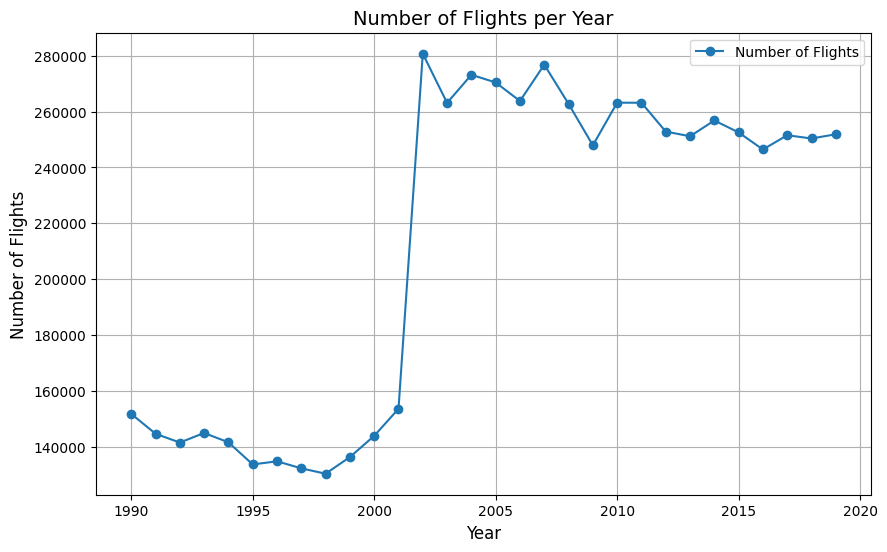

In [ ]:
# Plot the number of flights per year
plt.figure(figsize=(10, 6))
plt.plot(yearly_data['year'], yearly_data['total_flights'], marker='o', label='Number of Flights')
plt.title('Number of Flights per Year', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of Flights', fontsize=12)
plt.grid(True)
plt.legend()
plt.show()

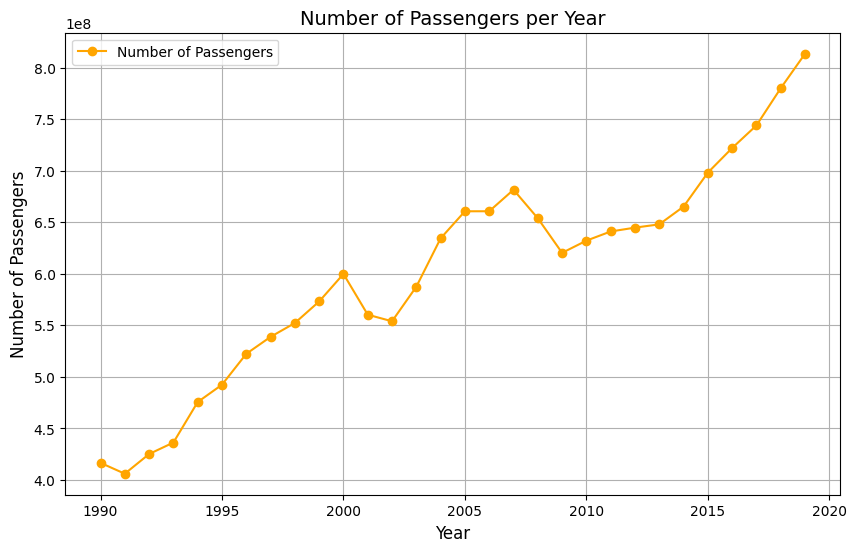

In [ ]:
# Plot the total number of passengers per year
plt.figure(figsize=(10, 6))
plt.plot(yearly_data['year'], yearly_data['total_passengers'], marker='o', color='orange', label='Number of Passengers')
plt.title('Number of Passengers per Year', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of Passengers', fontsize=12)
plt.grid(True)
plt.legend()
plt.show()

Next, we will remove those entries that have a number of passangers equal to 0, since it is considered a discrepancy and error.

In [ ]:
data_clean = data.loc[data['passengers'] > 0]

Let's remove the columns we are not interested in:

In [ ]:
columns_to_drop = ['freight', 'mail', 'airline_id',
                   'unique_carrier', 'unique_carrier_name',
                   'unique_carrier_entity', 'region',
                   'carrier_name', 'carrier_group', 'carrier_group_new' ,
                   'distance_group', 'class']
data_filtered = data_clean.drop(columns=columns_to_drop, errors='ignore')

In [ ]:
data_filtered.head()

,source,target,passengers,distance,carrier,year,quarter,month
4565,0,92,1,303,AA,1991,4,11
4566,0,81,1,806,WN,1992,3,9
4567,0,176,1,1036,UA,1992,3,9
4568,0,160,1,349,DL,1992,4,11
4569,0,40,1,918,CO,1992,4,11


In [ ]:
data_filtered.shape

(5429210, 8)

There are still a lot of edges in the network. In order to make it simplify and make the calculation computationally effective, we will sum up the number of flights from source and target from the same year, thus creating a weight and decreasing the number of rows.





In [ ]:
# Aggregate data by source, target, and year
aggregated_data = data_filtered.groupby(['source', 'target', 'year']).agg(
    total_flights=('passengers', 'count'),  # Count the number of flights (rows)
    total_passengers=('passengers', 'sum')  # Sum the passengers
).reset_index()

In [ ]:
aggregated_data.head()

,source,target,year,total_flights,total_passengers
0,0,0,2008,1,139
1,0,0,2009,3,176
2,0,0,2011,1,49
3,0,0,2016,4,57
4,0,0,2017,5,53


In [ ]:
aggregated_data.shape

(535568, 5)

## NETWORK CHARACTERISTICS

We will calculate basic characteristics of the network.

### Basic features

In [ ]:
import networkx as nx

# Represent DIRECTED network
# Create a directed graph from the edge list
G = nx.from_pandas_edgelist(
    aggregated_data,
    source='source',
    target='target',
    edge_attr='total_passengers', # Use the weight
    create_using=nx.DiGraph()
)

In [ ]:
# Number of nodes
num_nodes = G.number_of_nodes()
print(f"Number of nodes: {G.number_of_nodes()}")

# Number of edges
num_edges = G.number_of_edges()
print(f"Number of edges: {G.number_of_edges()}")

Number of nodes: 2002
Number of edges: 74943


In [ ]:
# Average degree
avg_degree = sum(dict(G.degree()).values()) / num_nodes
print(f"Average degree: {avg_degree}")

Average degree: 74.86813186813187


In [ ]:
# Average clustering coefficient
avg_clustering = nx.average_clustering(G)
print(f"Average clustering coefficient: {avg_clustering}")

Average clustering coefficient: 0.5283260632281082


In [ ]:
# Assortativity (degree correlation)
assortativity = nx.degree_assortativity_coefficient(G)
print(f"Assortativity coefficient: {assortativity}")

Assortativity coefficient: 0.05087301517435331


### Distances

In [ ]:
# Find the strongly connected components (SCCs)
sccs = list(nx.strongly_connected_components(G))

# Find the largest strongly connected component (SCC)
largest_scc = max(sccs, key=len)

# Create a subgraph of the largest SCC
G_scc = G.subgraph(largest_scc)

# Check the number of nodes in the largest SCC
print(f"Number of nodes in the largest SCC: {len(G_scc)}")

# Calculate distances for the largest SCC
try:
  # Calculate the radius (minimum eccentricity)
  radius = nx.radius(G_scc)

  # Calculate the diameter (longest shortest path)
  diameter = nx.diameter(G_scc)

  # Calculate the average shortest path length
  avg_shortest_path = nx.average_shortest_path_length(G_scc)

  # Output the calculated distances
  print(f"Radius of the largest SCC: {radius}")
  print(f"Diameter of the largest SCC: {diameter}")
  print(f"Average shortest path length of the largest SCC: {avg_shortest_path}")

except nx.NetworkXError as e:
  print(f"Error in calculating distances: {e}")


Number of nodes in the largest SCC: 1838
Radius of the largest SCC: 4
Diameter of the largest SCC: 7
Average shortest path length of the largest SCC: 2.8959411279330745


### Degree distribution

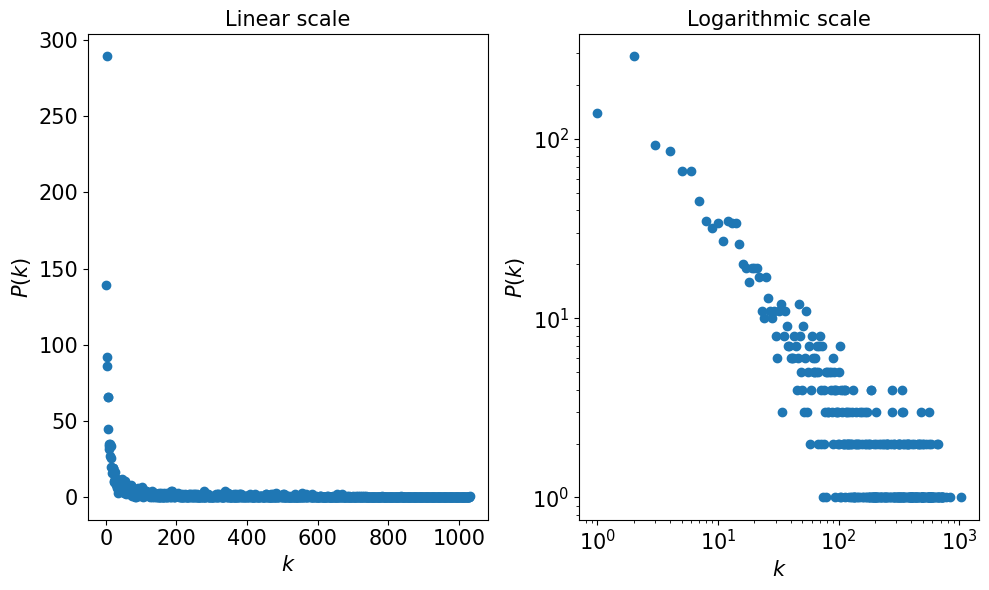

In [ ]:
fig,ax=plt.subplots(1,2,figsize=(10,6))

degree_sequence=[G.degree(node) for node in G.nodes()]

degree_counts = Counter(degree_sequence)
min_degree=min(degree_sequence)
max_degree=max(degree_sequence)

degree = list(range(min_degree, max_degree + 1))
degree_count = [degree_counts.get(x, 0) for x in degree]

ax[0].scatter(degree, degree_count,label='data')
ax[1].scatter(degree, degree_count,label='data')

ax[0].set_xlabel('$k$',fontsize=15)  ### Set label of the axis
ax[0].set_ylabel('$P(k)$',fontsize=15)

ax[1].set_xlabel('$k$',fontsize=15) ### Set label of the axis
ax[1].set_ylabel('$P(k)$',fontsize=15)

ax[1].set_yscale('log') ### Set logarithmic scale
ax[1].set_xscale('log')

ax[0].tick_params(which='major',axis='both',labelsize=15) ### Size labels ticks
ax[1].tick_params(which='major',axis='both',labelsize=15)


ax[0].set_title('Linear scale',fontsize=15)
ax[1].set_title('Logarithmic scale',fontsize=15)
fig.tight_layout()

### Scale free property

<ipython-input-44-1ac931509233>:34: RuntimeWarning: divide by zero encountered in log
  log_ccdf_fit=np.log(ccdf)[:-1]


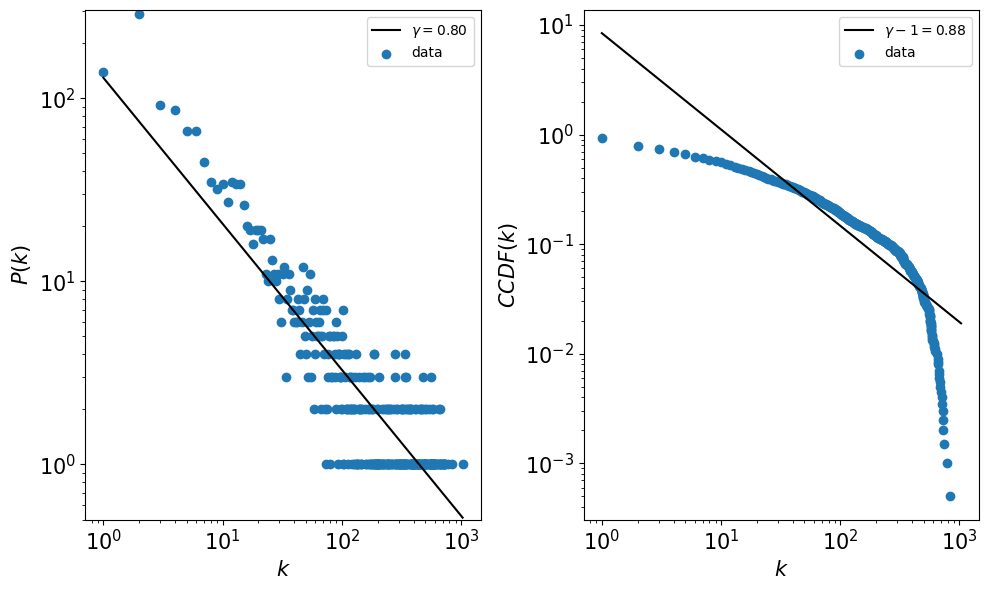

In [ ]:
fig,ax=plt.subplots(1,2,figsize=(10,6), sharex=False, sharey=False)

log_degree = [np.log(degree[i]) for i in range(len(degree)) if degree_count[i]!=0] ### Use the degree classes with at least one node
log_degree_count = [np.log(degree_count[i]) for i in range(len(degree_count)) if degree_count[i]!=0] ### Use the degree classes with at least one node

m,b = np.polyfit(log_degree, log_degree_count, 1) ## Fit log(P(k)) to a line with slope m and intercept b

theoretical=[np.exp(b)*k**m for k in degree] ### obtain the theoretical values from the fitted parameters

ax[0].plot(degree, theoretical, color='black', label=r'$\gamma=%.2lf$'%(-m))
ax[0].scatter(degree, degree_count, label='data')
ax[0].set_ylim(0.5,)
ax[0].set_yscale('log')
ax[0].set_xscale('log')
ax[0].set_xlabel('$k$',fontsize=15)
ax[0].set_ylabel('$P(k)$',fontsize=15)
ax[0].tick_params(which='major',axis='both',labelsize=15)
ax[0].legend()

degree_counts = Counter(degree_sequence)
min_degree=min(degree_sequence)
max_degree=max(degree_sequence)

degree = list(range(min_degree, max_degree + 1))
degree_count = [degree_counts.get(k, 0) for k in degree]

degree=[degree[i] for i in range(len(degree)) if degree_count[i]!=0]
degree_count=[degree_count[i] for i in range(len(degree_count)) if degree_count[i]!=0]

cdf=np.cumsum(degree_count)/G.number_of_nodes() ### Get the cumulative sum of the distribution (without normalized)
ccdf=np.ones(len(cdf))-cdf #### Get the CCDF

log_degree_fit = [np.log(degree[i]) for i in range(len(degree))][:-1] ## Last point should be excluded as 0 in logarithmic scale is not finite
log_ccdf_fit=np.log(ccdf)[:-1]

m,b = np.polyfit(log_degree_fit, log_ccdf_fit, 1)

theoretical = [np.exp(b)*k**m for k in degree]

ax[1].plot(degree, theoretical, color='black',label=r'$\gamma-1=%.2f$'%(-m))
ax[1].scatter(degree, ccdf,label='data')

ax[1].set_yscale('log')
ax[1].set_xscale('log')

ax[1].set_xlabel('$k$',fontsize=15)
ax[1].set_ylabel('$CCDF(k)$',fontsize=15)

ax[1].tick_params(which='major',axis='both',labelsize=15)
ax[1].legend()

fig.tight_layout()
plt.show()

### Centralities

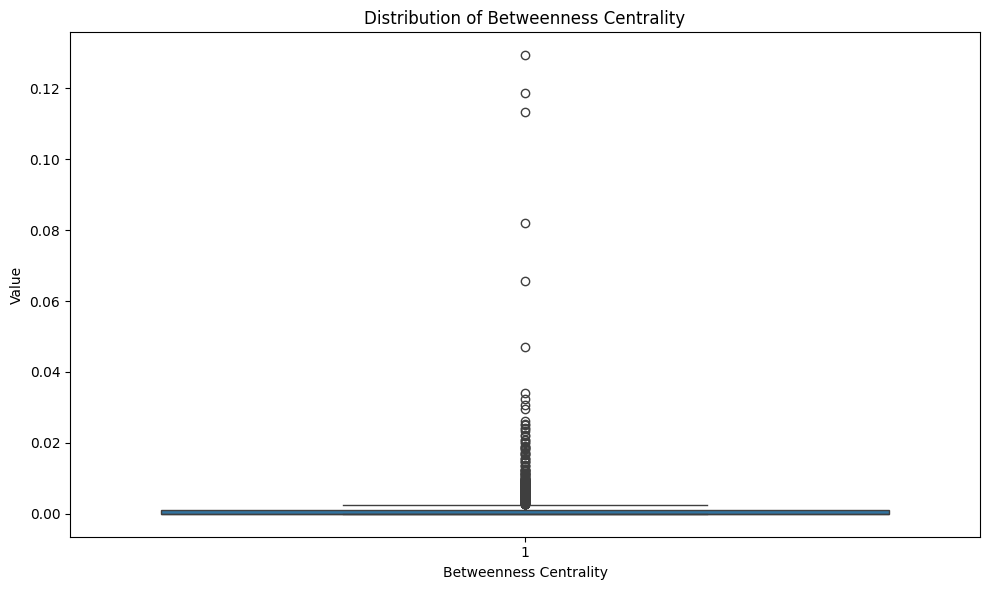

In [ ]:
# Betweenness
betweenness_centrality = nx.betweenness_centrality(G, weight='total_passengers', normalized=True)
betweenness_sorted = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)

# Display a box plot of the betweenness centrailities using seaborn
fig, ax = plt.subplots(figsize=(10, 6))
sns.boxplot(x=[1] * len(betweenness_sorted), y=[x[1] for x in betweenness_sorted], ax=ax)
ax.set_xlabel('Betweenness Centrality')
ax.set_ylabel('Value')
ax.set_title('Distribution of Betweenness Centrality')
plt.tight_layout()
plt.show()


In [ ]:
# Display top 10 nodes by betweenness centrality
top_10_betweenness = betweenness_sorted[:10]
print("Top 10 nodes by betweenness centrality:")
for node, centrality in top_10_betweenness:
  city_name = node_info[node_info['index'] == node]['city_name'].iloc[0]
  output = f"Node {node:3} | City: {city_name:15}\t: {centrality:.6f} betweenness centrality"
  print(output)

Top 10 nodes by betweenness centrality:
Node 110 | City: Anchorage, AK  	: 0.129323 betweenness centrality
Node 208 | City: White Plains, NY	: 0.118687 betweenness centrality
Node 196 | City: Fairbanks, AK  	: 0.113229 betweenness centrality
Node 133 | City: Burbank, CA    	: 0.081975 betweenness centrality
Node 444 | City: Teterboro, NJ  	: 0.065568 betweenness centrality
Node 185 | City: King Salmon, AK	: 0.047126 betweenness centrality
Node  55 | City: Burlington, VT 	: 0.034179 betweenness centrality
Node 247 | City: Seattle, WA    	: 0.032486 betweenness centrality
Node 135 | City: Chicago, IL    	: 0.030790 betweenness centrality
Node 109 | City: Juneau, AK     	: 0.029428 betweenness centrality


In [ ]:
# Calculate other centrality metrics
degree_centrality = nx.degree_centrality(G)
eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000)
closeness_centrality = nx.closeness_centrality(G)

In [ ]:
# Combine the centrality metrics into a single dictionary for comparison
node_importance = {
    node: {
        "degree": degree_centrality[node],
        "betweenness": betweenness_centrality[node],
        "eigenvector": eigenvector_centrality[node],
        "closeness": closeness_centrality[node],
    }
    for node in G.nodes()
}

# Sort by betweenness centrality (most critical nodes first)
critical_nodes = sorted(node_importance.items(), key=lambda x: x[1]["betweenness"], reverse=True)

# Display the top 10 critical hubs
print("Top 10 critical hubs (by betweenness centrality):")
for node, metrics in critical_nodes[:10]:
  city_name = node_info[node_info['index'] == node]['city_name'].iloc[0]
  df_metrics = pd.DataFrame(metrics.values(), index=metrics.keys()).transpose()
  output = f"-- Node {node:3} | City: {city_name:15}--\n  Metrics:\n{df_metrics.to_string(index = False)}"
  print(output)


Top 10 critical hubs (by betweenness centrality):
-- Node 110 | City: Anchorage, AK  --
  Metrics:
  degree  betweenness  eigenvector  closeness
0.349825     0.129323     0.042107   0.481397
-- Node 208 | City: White Plains, NY--
  Metrics:
  degree  betweenness  eigenvector  closeness
0.515242     0.118687     0.082805    0.48755
-- Node 196 | City: Fairbanks, AK  --
  Metrics:
  degree  betweenness  eigenvector  closeness
0.250375     0.113229     0.024291   0.446506
-- Node 133 | City: Burbank, CA    --
  Metrics:
  degree  betweenness  eigenvector  closeness
0.390805     0.081975     0.079499   0.487948
-- Node 444 | City: Teterboro, NJ  --
  Metrics:
  degree  betweenness  eigenvector  closeness
0.417791     0.065568      0.07046   0.474642
-- Node 185 | City: King Salmon, AK--
  Metrics:
  degree  betweenness  eigenvector  closeness
0.135932     0.047126     0.003819   0.397235
-- Node  55 | City: Burlington, VT --
  Metrics:
  degree  betweenness  eigenvector  closeness
0.197401

## GENERAL NETWORK VISUALISATION

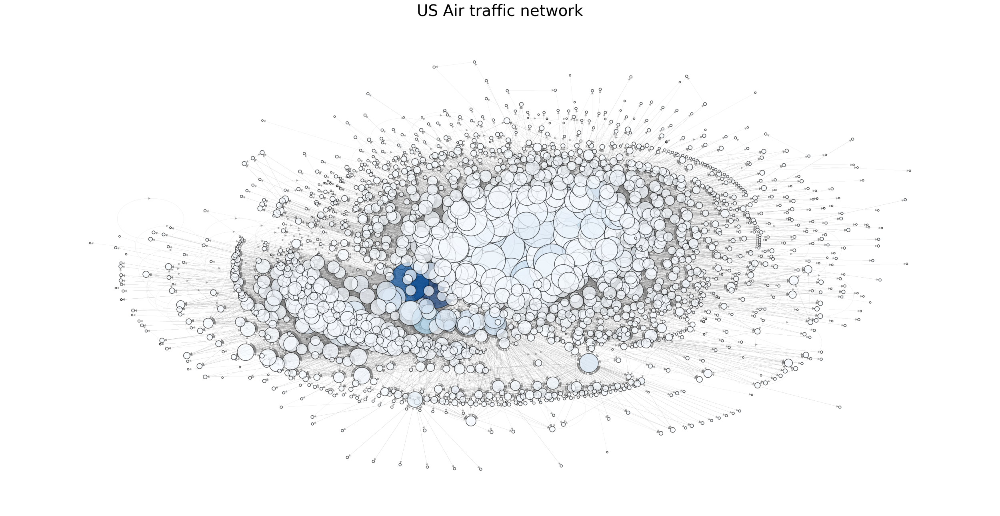

In [ ]:
# Set positions
positions = nx.kamada_kawai_layout(G)

# Set the size of the nodes
nodes_sizes=[10*G.degree(node) for node in G.nodes()]

# Set the color of the nodes based on betweenness
nodes_color=[10*betweenness_centrality[node] for node in G.nodes()]

# Generate the plot
fig, ax = plt.subplots(1, 1, figsize=(32, 16))
nx.draw_networkx(G, pos=positions, node_size=nodes_sizes, node_color=nodes_color,
                 width=0.1, alpha=0.7, edge_color='gray', edgecolors="black",
                 with_labels=False, cmap='Blues',
                 vmin=min(nodes_color), vmax=max(nodes_color), ax=ax)
ax.axis('off')
ax.set_title("US Air traffic network", fontsize=28)
plt.show()

## NETWORK RESILIENCE ANALYSIS

In [ ]:
# Auxiliar functions
def RandomAttack(G, occ_prob):
  nodes_to_delete = [node for node in G.nodes() if np.random.random() > occ_prob]
  G.remove_nodes_from(nodes_to_delete)
  return G

def TargetedAttack(G, occ_prob):
  degrees = dict(G.degree())
  sorted_nodes = sorted(degrees, key=degrees.get, reverse=True)
  cut = round( (1 - occ_prob) * len(sorted_nodes))
  nodes_to_delete = sorted_nodes[0:cut]
  G.remove_nodes_from(nodes_to_delete)
  return G

In [ ]:
def component_sizes_directed(G):
  # Extract the sizes of strongly connected components
  component_sizes = [len(c) for c in nx.strongly_connected_components(G)]

  # Return the size of the largest strongly connected component
  return max(component_sizes, default=0), component_sizes

def plot_giant_component_vs_mean_degree(mean_degree_list, giant_component_sizes):
  # Plot the results
  plt.plot(mean_degree_list, giant_component_sizes, marker='o', linestyle='-', color='b')
  plt.title('Giant Component Size vs Mean Degree; ER net - Simulations')
  plt.xlabel('Mean Degree')
  plt.ylabel('Giant Component Size')
  plt.grid(True)
  plt.show()

### Random attack simulation

In [ ]:
# Apply random attacks on your air traffic network
occ_prob = 0.7  # Fraction of nodes to keep
random_attacked_graph = RandomAttack(G.copy(), occ_prob)

# Measure the giant component size
giant_component_size = component_sizes_directed(random_attacked_graph)[0]
print(f"Giant component size after random attack: {giant_component_size}")

Giant component size after random attack: 1154


### Targeted attack simulation

In [ ]:
# Apply targeted attacks on the network (based on degree centrality)
targeted_attacked_graph = TargetedAttack(G.copy(), occ_prob)

# Measure the giant component size
giant_component_size = component_sizes_directed(targeted_attacked_graph)[0]
print(f"Giant component size after targeted attack: {giant_component_size}")

Giant component size after targeted attack: 391


### Visualization of resilience

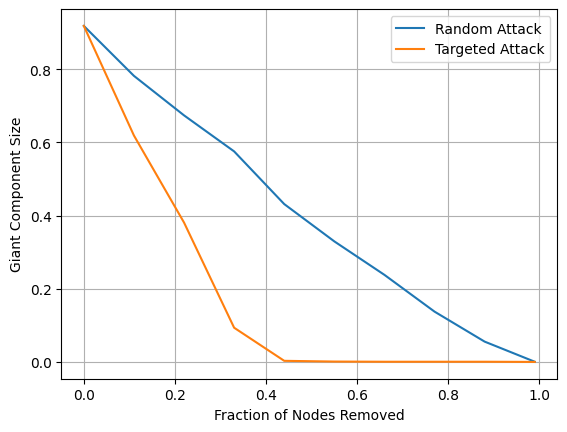

In [ ]:
# Plot giant component size vs fraction of removed nodes
import matplotlib.pyplot as plt
occ_prob_list = np.linspace(0.01, 1, 10)
gc_sizes_random = []
gc_sizes_targeted = []

for occ_prob in occ_prob_list:
  random_attacked = RandomAttack(G.copy(), occ_prob)
  targeted_attacked = TargetedAttack(G.copy(), occ_prob)

  gc_sizes_random.append(component_sizes_directed(random_attacked)[0] / G.number_of_nodes())
  gc_sizes_targeted.append(component_sizes_directed(targeted_attacked)[0] / G.number_of_nodes())

plt.plot(1 - occ_prob_list, gc_sizes_random, label='Random Attack')
plt.plot(1 - occ_prob_list, gc_sizes_targeted, label='Targeted Attack')
plt.xlabel('Fraction of Nodes Removed')
plt.ylabel('Giant Component Size')
plt.legend()
plt.grid(True)
plt.show()


## TEMPORAL ANALYSIS

First we create the temporal snapshots.

In [ ]:
# Group the dataset by year and create a graph for each year
snapshots = {}
years = aggregated_data['year'].unique()

for year in years:
    # Filter edges for the current year
    edges_year = aggregated_data[aggregated_data['year'] == year]

    # Create a directed graph for the year
    G_year = nx.from_pandas_edgelist(
        edges_year,
        source='source',
        target='target',
        edge_attr='total_passengers',
        create_using=nx.DiGraph()
    )
    snapshots[year] = G_year

print(f"Generated {len(snapshots)} snapshots, one for each year.")

Generated 31 snapshots, one for each year.


### Metrics analysis over time

<ipython-input-36-d87407ccdc38>:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  nodes_by_year = data[data['year'] != 2020].groupby('year').apply(


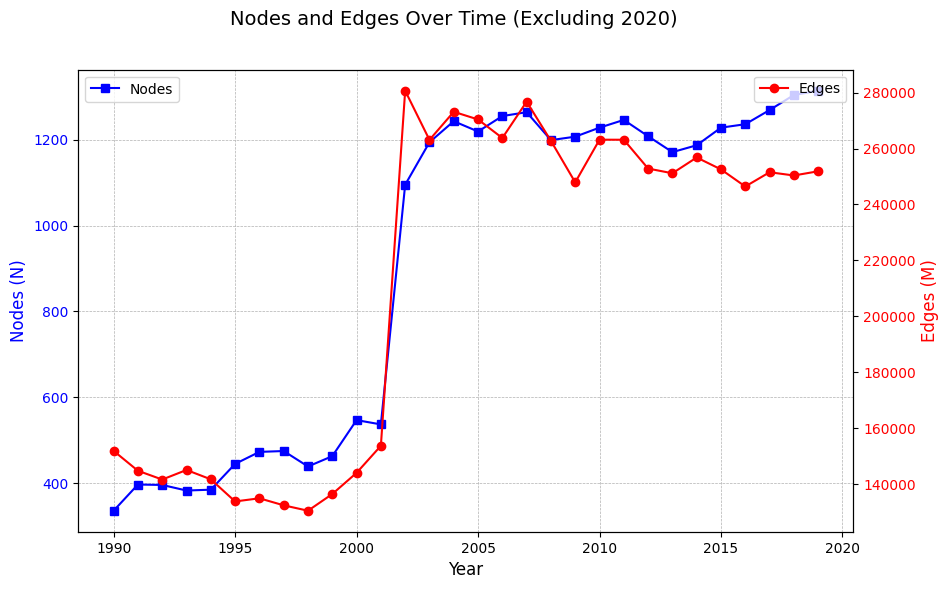

In [ ]:
# Calculate the total edges per year, excluding 2020
edges_by_year = data[data['year'] != 2020].groupby('year').size()

# Calculate the total nodes per year, excluding 2020
nodes_by_year = data[data['year'] != 2020].groupby('year').apply(
    lambda x: len(set(x['source']).union(set(x['target'])))
)

# Plot the nodes and edges over time
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot nodes (N) on the left y-axis
ax1.set_xlabel('Year', fontsize=12)
ax1.set_ylabel('Nodes (N)', fontsize=12, color='blue')
ax1.plot(nodes_by_year.index, nodes_by_year, marker='s', color='blue', label='Nodes')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.grid(True, linestyle="--", linewidth=0.5)

# Plot edges (M) on the right y-axis
ax2 = ax1.twinx()
ax2.set_ylabel('Edges (M)', fontsize=12, color='red')
ax2.plot(edges_by_year.index, edges_by_year, marker='o', color='red', label='Edges')
ax2.tick_params(axis='y', labelcolor='red')

# Add title and legends
fig.suptitle('Nodes and Edges Over Time (Excluding 2020)', fontsize=14)
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Show the plot
plt.show()

In [ ]:
# Initialize lists to store metrics
avg_clustering_coeff = []
avg_shortest_path_length = []

# Iterate over yearly snapshots and compute metrics
for year in years:
  G = snapshots[year]

  # Calculate average clustering coefficient
  clustering_coeff = nx.average_clustering(G.to_undirected())  # Clustering is for undirected graphs
  avg_clustering_coeff.append(clustering_coeff)

  # Calculate average shortest path length (for the largest SCC)
  try:
    # Find the largest strongly connected component
    largest_scc = max(nx.strongly_connected_components(G), key=len)
    G_scc = G.subgraph(largest_scc).copy()

    # Compute the average shortest path length
    avg_path_length = nx.average_shortest_path_length(G_scc)
  except nx.NetworkXError:
    avg_path_length = float('inf')  # If disconnected, set to infinity

  avg_shortest_path_length.append(avg_path_length)

print("Metrics computed for all years.")

Metrics computed for all years.


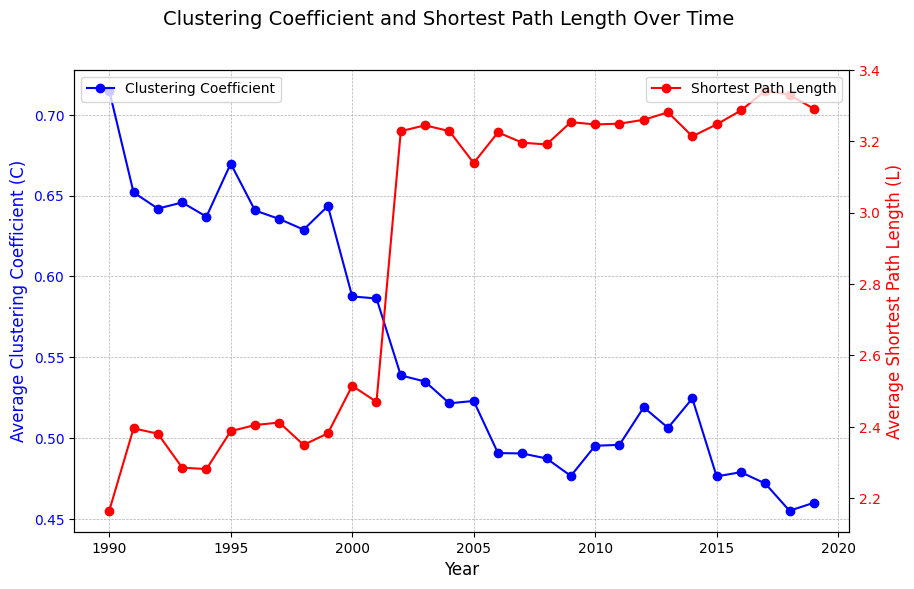

In [ ]:
# Sort the data by year
sorted_data = sorted(zip(years, avg_clustering_coeff, avg_shortest_path_length))
years_sorted, avg_clustering_coeff_sorted, avg_shortest_path_length_sorted = zip(*sorted_data)

# Exclude the last value
years_trimmed = years_sorted[:-1]
avg_clustering_coeff_trimmed = avg_clustering_coeff_sorted[:-1]
avg_shortest_path_length_trimmed = avg_shortest_path_length_sorted[:-1]

# Plot the metrics over time
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot average clustering coefficient on the left y-axis
ax1.set_xlabel('Year', fontsize=12)
ax1.set_ylabel('Average Clustering Coefficient (C)', fontsize=12, color='blue')
ax1.plot(years_trimmed, avg_clustering_coeff_trimmed, marker='o', linestyle='-', color='blue', label='Clustering Coefficient')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.grid(True, linestyle="--", linewidth=0.5)

# Plot average shortest path length on the right y-axis
ax2 = ax1.twinx()
ax2.set_ylabel('Average Shortest Path Length (L)', fontsize=12, color='red')
ax2.plot(years_trimmed, avg_shortest_path_length_trimmed, marker='o', linestyle='-', color='red', label='Shortest Path Length')
ax2.tick_params(axis='y', labelcolor='red')

# Add title and legends
fig.suptitle('Clustering Coefficient and Shortest Path Length Over Time', fontsize=14)
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Show the plot
plt.show()

### Temporality

Create the function to compute temporality.

In [ ]:
def compute_temporality_and_overlap(snapshots):
    # Extract all unique edges across all snapshots
    all_edges = set()
    for G in snapshots.values():
        all_edges.update(G.edges())

    # Initialize temporality tracker
    edge_persistence = {edge: 0 for edge in all_edges}

    # Temporality: Calculate edge persistence across all consecutive snapshots
    years = sorted(snapshots.keys())
    for i in range(len(years) - 1):
        G_t = snapshots[years[i]]
        G_t1 = snapshots[years[i + 1]]

        # Check if each edge persists across consecutive snapshots
        for edge in all_edges:
            if edge in G_t.edges() and edge in G_t1.edges():
                edge_persistence[edge] += 1

    # Calculate global temporality
    total_edges = len(all_edges)
    temporality = sum(edge_persistence.values()) / total_edges if total_edges > 0 else 0

    # Edge overlap trends
    overlap_trends = []
    temporality_trends = []

    for i in range(len(years) - 1):
        year = years[i]
        next_year = years[i + 1]

        G_t = snapshots[year]
        G_t1 = snapshots[next_year]

        # Common edges for overlap
        common_edges = set(G_t.edges()).intersection(set(G_t1.edges()))
        overlap = len(common_edges) / len(G_t.edges()) if G_t.edges() else 0

        # Temporality for this interval
        edge_count = len(common_edges)
        interval_temporality = edge_count / total_edges if total_edges > 0 else 0

        overlap_trends.append({"year": year, "overlap": overlap})
        temporality_trends.append({"year": year, "temporality": interval_temporality})

    return temporality, edge_persistence, overlap_trends, temporality_trends

def compute_temporality(snapshots):
  # Extract all unique edges across all snapshots
  all_edges = set()
  for G in snapshots.values():
    all_edges.update(G.edges())

  # Initialize temporality tracker
  edge_persistence = {edge: 0 for edge in all_edges}

  # Calculate edge persistence across consecutive snapshots
  years = sorted(snapshots.keys())
  for i in range(len(years) - 1):
    G_t = snapshots[years[i]]
    G_t1 = snapshots[years[i + 1]]

    # Check if each edge persists across consecutive snapshots
    for edge in all_edges:
      if edge in G_t.edges() and edge in G_t1.edges():
        edge_persistence[edge] += 1

  # Calculate temporality
  total_edges = len(all_edges)
  temporality = sum(edge_persistence.values()) / total_edges if total_edges > 0 else 0

  return temporality, edge_persistence

Apply the function to the year snapshots:

Temporality: 4.894506491600282


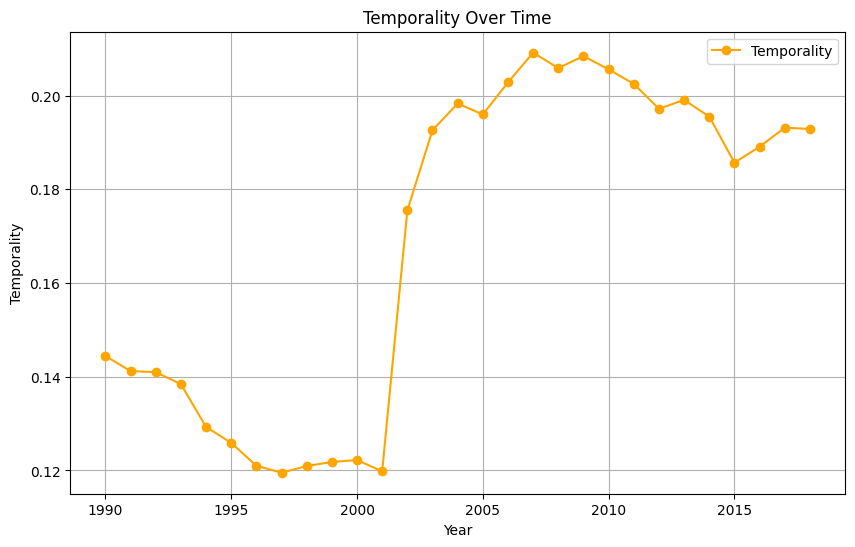

In [ ]:
# Compute temporality and overlap trends
temporality, edge_persistence, overlap_trends, temporality_trends = compute_temporality_and_overlap(snapshots)

# Convert trends to DataFrames for plotting
overlap_df = pd.DataFrame(overlap_trends)
temporality_df = pd.DataFrame(temporality_trends)

# Exclude the last data point from each DataFrame
overlap_df_trimmed = overlap_df.iloc[:-1]
temporality_df_trimmed = temporality_df.iloc[:-1]

# Compute the sum of temporality across all intervals
total_temporality_sum = temporality_df_trimmed['temporality'].sum()
print(f"Temporality: {total_temporality_sum}")

# Plot Temporality
plt.figure(figsize=(10, 6))
plt.plot(temporality_df_trimmed['year'], temporality_df_trimmed['temporality'], marker='o', color='orange', label='Temporality')
plt.xlabel("Year")
plt.ylabel("Temporality")
plt.title("Temporality Over Time")
plt.grid(True)
plt.legend()
plt.show()


 Let's compare the empirical network to a randomized network to see if the observed temporality is unique.

In [ ]:
import random
def randomize_across_snapshots(snapshots):
    all_edges = []
    for G in snapshots.values():
        all_edges.extend(G.edges())

    # Shuffle all edges across all snapshots
    random.shuffle(all_edges)

    randomized_snapshots = {}
    for year, G in snapshots.items():
        randomized_G = nx.DiGraph()
        randomized_G.add_nodes_from(G.nodes())

        # Assign random edges to this snapshot
        num_edges = len(G.edges())
        randomized_edges = all_edges[:num_edges]
        all_edges = all_edges[num_edges:]  # Remove assigned edges
        randomized_G.add_edges_from(randomized_edges)
        randomized_snapshots[year] = randomized_G

    return randomized_snapshots

randomized_snapshots = randomize_across_snapshots(snapshots)
random_temporality, _ = compute_temporality(randomized_snapshots)

print(f"Randomized Network Temporality: {random_temporality}")

Randomized Network Temporality: 1.9835474960970338


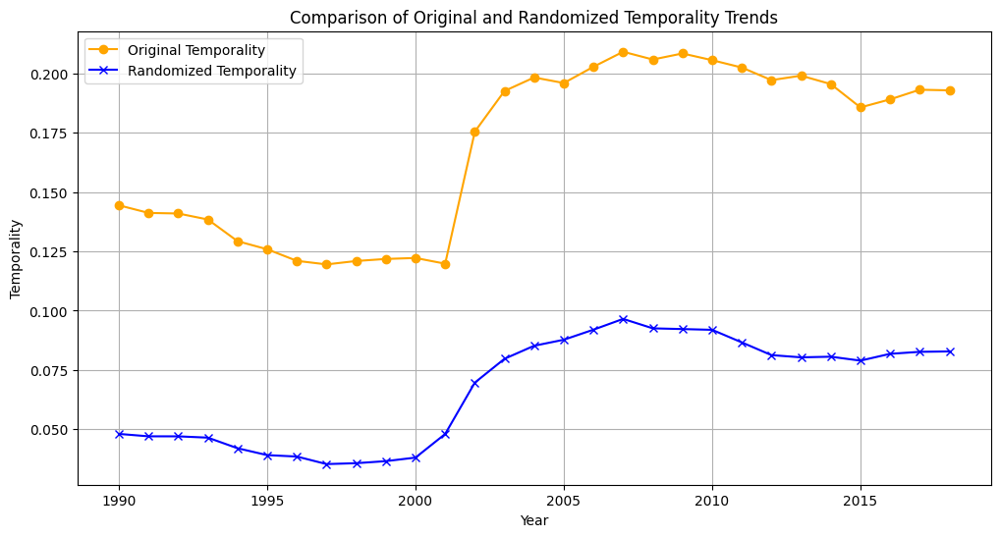

In [ ]:
# Compute original temporality trends
temporality, edge_persistence, _, temporality_trends = compute_temporality_and_overlap(snapshots)

# Convert original temporality trends to DataFrame
temporality_df = pd.DataFrame(temporality_trends)
temporality_df_trimmed = temporality_df.iloc[:-1]  # Exclude the last value

# Generate randomized temporality trends
randomized_snapshots = randomize_across_snapshots(snapshots)
_, _, _, randomized_temporality_trends = compute_temporality_and_overlap(randomized_snapshots)

# Convert randomized temporality trends to DataFrame
random_temporality_df = pd.DataFrame(randomized_temporality_trends)
random_temporality_df_trimmed = random_temporality_df.iloc[:-1]  # Exclude the last value

# Plot comparison of original and randomized temporality trends
plt.figure(figsize=(12, 6))
plt.plot(
    temporality_df_trimmed['year'], temporality_df_trimmed['temporality'],
    marker='o', color='orange', label='Original Temporality'
)
plt.plot(
    random_temporality_df_trimmed['year'], random_temporality_df_trimmed['temporality'],
    marker='x', color='blue', label='Randomized Temporality'
)
plt.xlabel("Year")
plt.ylabel("Temporality")
plt.title("Comparison of Original and Randomized Temporality Trends")
plt.grid(True)
plt.legend()
plt.show()

## HISTORICAL EVENTS ANALYSIS

### General display of airports across the US

In [ ]:
# Initialize dictionary to store the betweenness centratities for each year
betweenness_centralities = {}

# Calculate betweenness centrality for each year
for year in years:
  G = snapshots[year]
  betweenness_centrality = nx.betweenness_centrality(G, weight='total_passengers', normalized=True)
  # Store the sorted betweenness centralities
  betweenness_centralities[year] = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)

In [ ]:
betweenness_centralities_with_airport_info = {}

# Using the betweenness centralies dictionary, merge the data with the US_airports data if avaliable
for year in years:
  betweenness_centralities_with_airport_info[year] = {}
  counter = 0
  for node, centrality in betweenness_centralities[year]:
    # if the airport info exists then combine it with the betweenness for the node according to the year
    if node_info[node_info['index'] == node]['airport_code'].iloc[0] in US_airports.index:
      lat = US_airports[US_airports.index == (node_info[node_info['index'] == node]['airport_code'].iloc[0])]['lat'].iloc[0]
      lon = US_airports[US_airports.index == (node_info[node_info['index'] == node]['airport_code'].iloc[0])]['lon'].iloc[0]

      betweenness_centralities_with_airport_info[year][counter] = [
        node,
        centrality,
        node_info[node_info['index'] == node]['airport_code'].iloc[0],
        node_info[node_info['index'] == node]['city_name'].iloc[0],
        node_info[node_info['index'] == node]['state_abr'].iloc[0],
        lat,
        lon
      ]
      counter += 1

In [ ]:
long_info = pd.DataFrame(betweenness_centralities_with_airport_info).melt(var_name="year", value_name="airport_info")
# expand the list in the airport_info column of long_info into seperate columns of long_info
long_info = pd.concat([long_info.drop(['airport_info'], axis=1), long_info['airport_info'].apply(pd.Series)], axis=1)
# set column names
col_names = ["year", "node_index", "betweenness_centrality", "airport_code", "city_name", "state_abr", "lat", "lon"]
long_info.columns = col_names
# drop rows where node_index is NA
long_info = long_info.dropna(subset=['node_index'])
# make node_index an int
long_info['node_index'] = long_info['node_index'].astype(int)
# combine airport_code and city_name as label
long_info['label'] = long_info['airport_code'] + ' - ' + long_info['city_name']
# order by year then by betweenness centrality
long_info = long_info.sort_values(by=['year', 'betweenness_centrality'], ascending=[True, False])

long_info.head()

,year,node_index,betweenness_centrality,airport_code,city_name,state_abr,lat,lon,label
4935,1990,110,0.142114,ANC,"Anchorage, AK",AK,61.17408,-149.99814,"ANC - Anchorage, AK"
4936,1990,107,0.099894,RNO,"Reno, NV",NV,39.49911,-119.76811,"RNO - Reno, NV"
4937,1990,117,0.087284,ROC,"Rochester, NY",NY,43.11914,-77.67187,"ROC - Rochester, NY"
4938,1990,288,0.081657,ISO,"Kinston, NC",NC,35.33143,-77.60883,"ISO - Kinston, NC"
4939,1990,84,0.079504,GTF,"Great Falls, MT",MT,47.48230,-111.37028,"GTF - Great Falls, MT"


In [ ]:
# Make a scatter_geo plot of the US showing long_info animated by year
fig = px.scatter_geo(long_info, hover_name = 'label', hover_data=['node_index'],
                     lat = 'lat', lon = 'lon', color = 'betweenness_centrality',
                     size = 'betweenness_centrality', animation_frame= 'year',
                     locationmode = 'USA-states', scope = 'usa',
                     title='US Airports Betweenness Centrality Over Time')
fig.show()
fig.write_html("betweenness_centrality_interactive.html")

In [ ]:
# Make a scatter_geo plot of the US showing long_info WITHOUT animations
fig = px.scatter_geo(long_info, hover_name = 'label', hover_data=['node_index'],
                     lat = 'lat', lon = 'lon', color = 'betweenness_centrality',
                     size = 'betweenness_centrality',
                     facet_col='year', facet_col_wrap=4,
                     facet_row_spacing=0.03, facet_col_spacing=0.0001,
                     locationmode = 'USA-states', scope = 'usa',
                     title='US Airports Betweenness Centrality Over Time',
                     height=5000, width=2000)
fig.show()
# save the image
fig.write_image("betweenness_centrality_over_time.png")

### Specific event analysis

Three events will be analysed:


1.   The Dot-com boom (2000) vs the 2008 Global financial crisis
2.   9/11 Attack
3.   SARS Outbreak 2003   




In [ ]:
# Define years before and after each event
event_years = {
    "dot com boom": [1999, 2001],
    "global financial crisis": [2007, 2009],
    "9.11 attacks": [2000, 2002],
    "sars pandemic": [2002, 2004]
}

#### Refined monthly groupings

In [ ]:
# Reestablish data groupings for a monthly basis
monthly_agg_data = data_filtered.groupby(['source', 'target', 'year', 'month']).agg(
  total_flights=('passengers', 'count'),  # Count the number of flights (rows)
  total_passengers=('passengers', 'sum')  # Sum the passengers
).reset_index()

In [ ]:
monthly_agg_data.shape

(3216399, 6)

In [ ]:
# Extract the each unique year month pairing present in the regrouped edges
unique_year_month_pairs = monthly_agg_data[['year', 'month']].drop_duplicates().sort_values(by=['year', 'month']).reset_index(drop=True)

In [ ]:
# Determine the number of unique pairings
print(f"Number of unique pairings: {len(unique_year_month_pairs)}")

Number of unique pairings: 361


#### Airports with known information

In [ ]:
node_info_with_loc = node_info.copy(deep=True)
# Add the latitude and longitude data to the node_info dataframe for each airport
for index, row in node_info_with_loc.iterrows():
  airport_code = row['airport_code']
  # Check if airport code is in the US_airport data
  if airport_code in US_airports.index:
    lat = US_airports[US_airports.index == airport_code]['lat'].iloc[0]
    lon = US_airports[US_airports.index == airport_code]['lon'].iloc[0]
    node_info_with_loc.loc[index, 'lat'] = lat
    node_info_with_loc.loc[index, 'lon'] = lon

# Drop rows where there is no info for lat and long
node_info_with_loc = node_info_with_loc.dropna(axis = 'index', subset=['lat', 'lon'])

In [ ]:
node_info_with_loc.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1477 entries, 0 to 2277
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   index           1477 non-null   int64  
 1   airport_code    1477 non-null   object 
 2   airport_id      1477 non-null   int64  
 3   airport_seq_id  1477 non-null   int64  
 4   city_market_id  1477 non-null   int64  
 5   origin          0 non-null      float64
 6   city_name       1477 non-null   object 
 7   state_abr       1477 non-null   object 
 8   state_fips      1477 non-null   int64  
 9   state_nm        1477 non-null   object 
 10  wac             1477 non-null   int64  
 11  _pos            1477 non-null   object 
 12  lat             1477 non-null   float64
 13  lon             1477 non-null   float64
dtypes: float64(3), int64(6), object(5)
memory usage: 173.1+ KB


#### Functions for computing graph metrics and plotting

In [ ]:
def compute_metrics_dataframe(year_month_pairs, data_filtered):

  output = pd.DataFrame(columns=['year', 'month', 'density','average_clustering', 'betweenness_centrality'])

  for pair in year_month_pairs.values:
    year, month = pair

    edges_filters = (data_filtered['year'] == year) & (data_filtered['month'] == month)
    edges_subset = data_filtered[edges_filters]

    G_subset = nx.from_pandas_edgelist(
      edges_subset,
      source='source',
      target='target',
      edge_attr='total_passengers',
      create_using=nx.DiGraph()
    )

    # metrics
    density = nx.density(G_subset)
    average_clustering = nx.average_clustering(G_subset.to_undirected(), weight="total_passengers")
    betweenness_centrality = nx.betweenness_centrality(G_subset, weight='total_passengers', normalized=True)
    betweenness_centralities = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)

    # filter betweenness_centralities for only nodes that are node_info_with_loc
    betweenness_centralities = [[x[0],
                                 x[1],
                                 node_info_with_loc[node_info_with_loc['index'] == x[0]]['lat'].iloc[0],
                                 node_info_with_loc[node_info_with_loc['index'] == x[0]]['lon'].iloc[0],
                                 node_info_with_loc[node_info_with_loc['index'] == x[0]]['airport_code'].iloc[0],
                                 node_info_with_loc[node_info_with_loc['index'] == x[0]]['city_name'].iloc[0],
                                 node_info_with_loc[node_info_with_loc['index'] == x[0]]['state_abr'].iloc[0],
                                 (node_info_with_loc[node_info_with_loc['index'] == x[0]]['airport_code'].iloc[0] +
                                  " - " +
                                  node_info_with_loc[node_info_with_loc['index'] == x[0]]['city_name'].iloc[0]),
                                ] for x in betweenness_centralities if x[0] in node_info_with_loc['index'].values]

    # set the values in the dataframe
    output.loc[len(output)] = [year, month,
                              density,
                              average_clustering,
                              betweenness_centralities]

  # Expand the dataframe based on the values of the betweenness_centralities column
  output = output.explode('betweenness_centrality')

  # Add new columns to the dataframe based on the exploded betweeenness_centralities
  output = pd.concat([output.drop(['betweenness_centrality'], axis=1), output['betweenness_centrality'].apply(pd.Series)], axis=1)

  # Rename the columns appropriately
  output.columns = ['year', 'month', 'density', 'average_clustering',
                    'node_index', 'betweenness_centrality', 'lat', 'lon',
                    'airport_code', 'city_name', 'state_abr', 'label']

  # Make node_index an integer
  output['node_index'] = output['node_index'].astype(int)

  # Make a new column with month and year combined

  output['month_year'] = output['month'].astype(str) + '-' + output['year'].astype(str)

  return output.reset_index(drop=True)

In [ ]:
def plot_animated_US_map(long_info: pd.DataFrame, plot_title = "",
                         save_file_name = "", show_plot = True):
  # Make a scatter_geo plot of the US showing long_info animated by year
  fig = px.scatter_geo(long_info, hover_name = 'label', hover_data=['node_index'],
                      lat = 'lat', lon = 'lon', color = 'betweenness_centrality',
                      size = 'betweenness_centrality', animation_frame= 'month_year',
                      locationmode = 'USA-states', scope = 'usa',
                      title = plot_title)
  if show_plot:
    fig.show()

  if save_file_name != "":
    if(save_file_name[:-5] != ".html"):
      save_file_name += ".html"
    if using_colab:
      os.makedirs("/content/maps/", exist_ok=True)
      path = "/content/maps/" + save_file_name
    else:
      os.makedirs("./maps/", exist_ok=True)
      path = "./maps/" + save_file_name

    fig.write_html(path)

  return fig


#### The Dot-com boom (2000) vs the 2008 Global financial crisis

In [ ]:
# Subset unique_year_month_pairs for Dotcom boom
dotcom_boom_pairs = unique_year_month_pairs[
  (unique_year_month_pairs['year'] >= event_years["dot com boom"][0]) &
  (unique_year_month_pairs['year'] <= event_years["dot com boom"][1])
]

# Subset unique_year_month_pairs for Global financial crisis
global_financial_crisis_pairs = unique_year_month_pairs[
  (unique_year_month_pairs['year'] >= event_years["global financial crisis"][0]) &
  (unique_year_month_pairs['year'] <= event_years["global financial crisis"][1])
]

In [ ]:
# Calculate the metrics dataframe for dotcom boom
dotcom_boom_monthly_metrics = compute_metrics_dataframe(dotcom_boom_pairs, monthly_agg_data)

In [ ]:
dotcom_boom_monthly_metrics.head()

,year,month,density,average_clustering,node_index,betweenness_centrality,lat,lon,airport_code,city_name,state_abr,label,month_year
0,1999,1,0.060516,0.008829,181,0.204521,42.88083,-85.52281,GRR,"Grand Rapids, MI",MI,"GRR - Grand Rapids, MI",1-1999
1,1999,1,0.060516,0.008829,116,0.170025,35.21936,-101.70592,AMA,"Amarillo, TX",TX,"AMA - Amarillo, TX",1-1999
2,1999,1,0.060516,0.008829,51,0.163397,45.58871,-122.59687,PDX,"Portland, OR",OR,"PDX - Portland, OR",1-1999
3,1999,1,0.060516,0.008829,54,0.160728,42.94693,-87.89706,MKE,"Milwaukee, WI",WI,"MKE - Milwaukee, WI",1-1999
4,1999,1,0.060516,0.008829,146,0.153011,39.04884,-84.66782,CVG,"Cincinnati, OH",KY,"CVG - Cincinnati, OH",1-1999


In [ ]:
dotcom_boom_monthly_metrics.shape

(12332, 13)

In [ ]:
_ = plot_animated_US_map(dotcom_boom_monthly_metrics, plot_title = "Dotcom Boom", save_file_name="dotcom_boom" , show_plot=True)

In [ ]:
# Calculate the metrics dataframe for the global financial crisis
global_financial_crisis_monthly_metrics = compute_metrics_dataframe(global_financial_crisis_pairs, monthly_agg_data)

In [ ]:
global_financial_crisis_monthly_metrics.head()

,year,month,density,average_clustering,node_index,betweenness_centrality,lat,lon,airport_code,city_name,state_abr,label,month_year
0,2007,1,0.017152,0.004494,110,0.421013,61.17408,-149.99814,ANC,"Anchorage, AK",AK,"ANC - Anchorage, AK",1-2007
1,2007,1,0.017152,0.004494,139,0.288890,26.50000,-81.80000,RSW,"Fort Myers, FL",FL,"RSW - Fort Myers, FL",1-2007
2,2007,1,0.017152,0.004494,57,0.199939,34.89567,-82.21886,GSP,"Greer, SC",SC,"GSP - Greer, SC",1-2007
3,2007,1,0.017152,0.004494,72,0.126629,36.19839,-95.88811,TUL,"Tulsa, OK",OK,"TUL - Tulsa, OK",1-2007
4,2007,1,0.017152,0.004494,196,0.119542,64.81536,-147.85667,FAI,"Fairbanks, AK",AK,"FAI - Fairbanks, AK",1-2007


In [ ]:
global_financial_crisis_monthly_metrics.shape

(25797, 13)

In [ ]:
_ = plot_animated_US_map(global_financial_crisis_monthly_metrics, plot_title = "Global Financial Crisis",
                          save_file_name="global_financial_crisis" , show_plot=True)

<ipython-input-88-be066b189f38>:9: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

<ipython-input-88-be066b189f38>:12: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

<ipython-input-88-be066b189f38>:18: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

<ipython-input-88-be066b189f38>:22: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



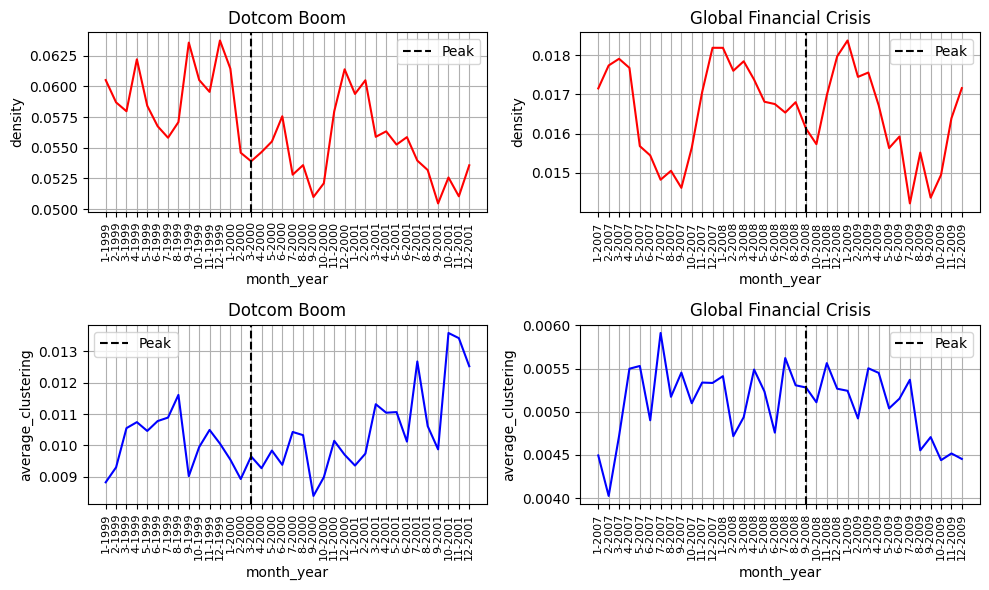

In [ ]:
dotcom_boom_grouped_metrics = dotcom_boom_monthly_metrics.groupby(['year', 'month', 'month_year'])[['density', 'average_clustering']].mean().reset_index()
global_financial_crisis_grouped_metrics = global_financial_crisis_monthly_metrics.groupby(['year', 'month', 'month_year'])[['density', 'average_clustering']].mean().reset_index()

fig, ax = plt.subplots(2,2, figsize=(10, 6))
# Plot the density
sns.lineplot(data=dotcom_boom_grouped_metrics, x='month_year', y='density', ax=ax[0,0], color='red')
ax[0,0].axvline("3-2000", color="black", linestyle="--", label="Peak")
ax[0,0].set_title("Dotcom Boom");
ax[0,0].set_xticklabels(ax[0,0].get_xticklabels(), rotation=90, fontsize=8);
sns.lineplot(data=global_financial_crisis_grouped_metrics, x='month_year', y='density', ax=ax[0,1], color='red')
ax[0,1].set_title("Global Financial Crisis");
ax[0,1].set_xticklabels(ax[0,1].get_xticklabels(), rotation=90, fontsize=8);
ax[0,1].axvline("9-2008", color="black", linestyle="--", label="Peak")
# Plot the average_clustering coefficient
sns.lineplot(data=dotcom_boom_grouped_metrics, x='month_year', y='average_clustering', ax=ax[1,0], color='blue')
ax[1,0].axvline("3-2000", color="black", linestyle="--", label="Peak")
ax[1,0].set_title("Dotcom Boom");
ax[1,0].set_xticklabels(ax[1,0].get_xticklabels(), rotation=90, fontsize=8);
sns.lineplot(data=global_financial_crisis_grouped_metrics, x='month_year', y='average_clustering', ax=ax[1,1], color='blue')
ax[1,1].axvline("9-2008", color="black", linestyle="--", label="Peak")
ax[1,1].set_title("Global Financial Crisis");
ax[1,1].set_xticklabels(ax[1,1].get_xticklabels(), rotation=90, fontsize=8);
# show grids
ax[0,0].grid(True)
ax[0,1].grid(True)
ax[1,0].grid(True)
ax[1,1].grid(True)
# show legends
ax[0,0].legend()
ax[0,1].legend()
ax[1,0].legend()
ax[1,1].legend()
plt.tight_layout()
plt.show()

#### 9/11 Attack

In [ ]:
# Subset unique_year_month_pairs for 9/11
nine_eleven_pairs = unique_year_month_pairs[
  (unique_year_month_pairs['year'] >= event_years["9.11 attacks"][0]) &
  (unique_year_month_pairs['year'] <= event_years["9.11 attacks"][1])
]

In [ ]:
nine_eleven_monthly_metrics = compute_metrics_dataframe(nine_eleven_pairs, monthly_agg_data)

In [ ]:
nine_eleven_monthly_metrics.head()

,year,month,density,average_clustering,node_index,betweenness_centrality,lat,lon,airport_code,city_name,state_abr,label,month_year
0,2000,1,0.061446,0.00955,181,0.148298,42.88083,-85.52281,GRR,"Grand Rapids, MI",MI,"GRR - Grand Rapids, MI",1-2000
1,2000,1,0.061446,0.00955,54,0.148128,42.94693,-87.89706,MKE,"Milwaukee, WI",WI,"MKE - Milwaukee, WI",1-2000
2,2000,1,0.061446,0.00955,111,0.146053,44.04533,-103.05736,RAP,"Rapid City, SD",SD,"RAP - Rapid City, SD",1-2000
3,2000,1,0.061446,0.00955,248,0.115669,40.82500,-115.79133,EKO,"Elko, NV",NV,"EKO - Elko, NV",1-2000
4,2000,1,0.061446,0.00955,131,0.106306,43.13988,-89.33750,MSN,"Madison, WI",WI,"MSN - Madison, WI",1-2000


In [ ]:
nine_eleven_monthly_metrics.shape

(15068, 13)

In [ ]:
_ = plot_animated_US_map(nine_eleven_monthly_metrics, plot_title = "9/11 Attacks",
                         save_file_name="nine_eleven_attacks" , show_plot=True)

<ipython-input-94-44a6034a3096>:8: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

<ipython-input-94-44a6034a3096>:13: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



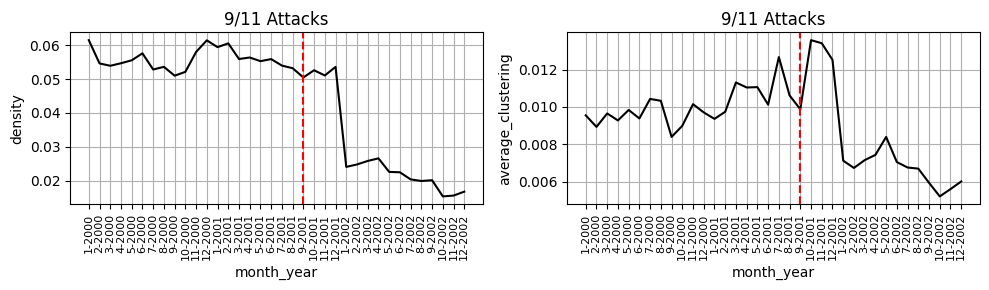

In [ ]:
nine_eleven_grouped_metrics = nine_eleven_monthly_metrics.groupby(['year', 'month', 'month_year'])[['density', 'average_clustering']].mean().reset_index()

fig, ax = plt.subplots(1,2, figsize=(10, 3))
# Plot the density
sns.lineplot(data=nine_eleven_grouped_metrics, x='month_year', y='density', ax=ax[0], color='black')
ax[0].axvline("9-2001", color="red", linestyle="--", label="9/11")
ax[0].set_title("9/11 Attacks");
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=90, fontsize=8);
# Plot the average_clustering coefficient
sns.lineplot(data=nine_eleven_grouped_metrics, x='month_year', y='average_clustering', ax=ax[1], color='black')
ax[1].axvline("9-2001", color="red", linestyle="--", label="9/11")
ax[1].set_title("9/11 Attacks");
ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=90, fontsize=8);
# show grid
ax[0].grid(True)
ax[1].grid(True)
# show legend

plt.tight_layout()
plt.show()

#### SARS Outbreak 2003

In [ ]:
# Subset unique_year_month_pairs for SARS Outbreak
SARS_pairs = unique_year_month_pairs[
  (unique_year_month_pairs['year'] >= event_years["sars pandemic"][0]) &
  (unique_year_month_pairs['year'] <= event_years["sars pandemic"][1])
]

In [ ]:
SARS_monthly_metrics = compute_metrics_dataframe(SARS_pairs, monthly_agg_data)

In [ ]:
SARS_monthly_metrics.head()

,year,month,density,average_clustering,node_index,betweenness_centrality,lat,lon,airport_code,city_name,state_abr,label,month_year
0,2002,1,0.024124,0.007121,110,0.330296,61.17408,-149.99814,ANC,"Anchorage, AK",AK,"ANC - Anchorage, AK",1-2002
1,2002,1,0.024124,0.007121,196,0.211720,64.81536,-147.85667,FAI,"Fairbanks, AK",AK,"FAI - Fairbanks, AK",1-2002
2,2002,1,0.024124,0.007121,13,0.193025,42.36294,-71.00639,BOS,"Boston, MA",MA,"BOS - Boston, MA",1-2002
3,2002,1,0.024124,0.007121,2,0.159624,29.53396,-98.46906,SAT,"San Antonio, TX",TX,"SAT - San Antonio, TX",1-2002
4,2002,1,0.024124,0.007121,142,0.140648,42.94043,-78.73057,BUF,"Buffalo, NY",NY,"BUF - Buffalo, NY",1-2002


In [ ]:
SARS_monthly_metrics.shape

(23507, 13)

In [ ]:
_ = plot_animated_US_map(SARS_monthly_metrics, plot_title = "SARS Outbreak",
                         save_file_name="SARS_outbreak" , show_plot=True)

<ipython-input-100-a46501f29762>:11: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

<ipython-input-100-a46501f29762>:18: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



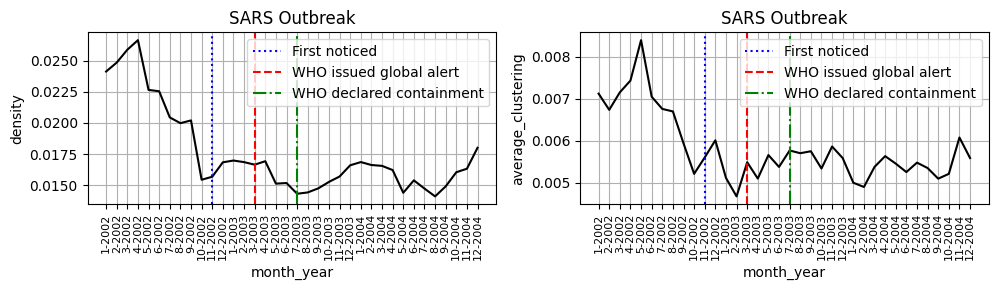

In [ ]:
SARS_grouped_metrics = SARS_monthly_metrics.groupby(['year', 'month', 'month_year'])[['density', 'average_clustering']].mean().reset_index()

fig, ax = plt.subplots(1,2, figsize=(10, 3))
# Plot the density
sns.lineplot(data=SARS_grouped_metrics, x='month_year', y='density', ax=ax[0], color='black')
# add a vertical line at month_year = 2-2003
ax[0].axvline("11-2002", color="blue", linestyle=":", label="First noticed")
ax[0].axvline("3-2003", color="red", linestyle="--", label="WHO issued global alert")
ax[0].axvline("7-2003", color="green", linestyle="-.", label="WHO declared containment")
ax[0].set_title("SARS Outbreak");
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=90, fontsize=8);
# Plot the average_clustering coefficient
sns.lineplot(data=SARS_grouped_metrics, x='month_year', y='average_clustering', ax=ax[1], color='black')
ax[1].axvline("11-2002", color="blue", linestyle=":", label="First noticed")
ax[1].axvline("3-2003", color="red", linestyle="--", label="WHO issued global alert")
ax[1].axvline("7-2003", color="green", linestyle="-.", label="WHO declared containment")
ax[1].set_title("SARS Outbreak");
ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=90, fontsize=8);
# show grid
ax[0].grid(True)
ax[1].grid(True)
# show legends
ax[0].legend()
ax[1].legend()
plt.tight_layout()
plt.show()

#### Saving maps for download

In [ ]:
# Save 'maps' file as a zip file
if using_colab:
  !zip -r '/content/maps.zip' '/content/maps'

  adding: content/maps/ (stored 0%)
  adding: content/maps/SARS_outbreak.html (deflated 69%)
  adding: content/maps/dotcom_boom.html (deflated 72%)
  adding: content/maps/global_financial_crisis.html (deflated 68%)
  adding: content/maps/nine_eleven_attacks.html (deflated 71%)
